In [1]:
import numpy as np 
import pandas as pd

**Loading the Dataset**

In [2]:
part1 = pd.read_csv('C:/Users/Hasitha Rasineni/.jupyter/all-the-news/articles1.csv',index_col=0)
part2 = pd.read_csv('C:/Users/Hasitha Rasineni/.jupyter/all-the-news/articles2.csv',index_col=0)
part3 = pd.read_csv('C:/Users/Hasitha Rasineni/.jupyter/all-the-news/articles3.csv',index_col=0)

**Displaying to see how the Data looks**

In [3]:
display(part1.head(3))

,id,title,publication,author,date,year,month,url,content
0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...
1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood..."
2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri..."


**Concatenating the three parts of articles into a Single one**

In [4]:
articles = pd.concat([part1,part2,part3])
articles.shape
# We have 142570 Articles in total; and 9 Features(ID, Title, Publication, Author, Date, Year, Month, URL, Content)

(142570, 9)

**Bar Plot of the Number of Articles from each Publication**

Text(0,0.5,'Number of Articles')

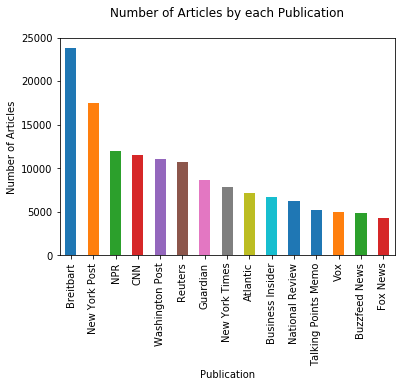

In [6]:
ax = articles['publication'].value_counts().plot('bar')
ax.set_title('Number of Articles by each Publication\n')
ax.set_xlabel('Publication')
ax.set_ylabel('Number of Articles')

****Data Cleaning****

**Removing Punctuation Marks from the Content and Title of Articles**

In [8]:
import string
import re

p = re.compile(r'[^\w\s]+')
articles['content_clean'] = [p.sub('', x) for x in articles['content'].tolist()]
articles['title'] = articles['title'].apply(str)
articles['title_clean'] = [p.sub('', x) for x in articles['title'].tolist()]
display(articles.head(3))

,id,title,publication,author,date,year,month,url,content,content_clean,title_clean
0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...,WASHINGTON Congressional Republicans have ...,House Republicans Fret About Winning Their Hea...
1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood...",After the bullet shells get counted the blood ...,Rift Between Officers and Residents as Killing...
2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri...",When Walt Disneys Bambi opened in 1942 critics...,Tyrus Wong Bambi Artist Thwarted by Racial Bia...


**Coverting text in Content and Title to lower case**

In [9]:
articles['content_clean'] = articles['content_clean'].str.lower()
articles['title_clean'] = articles['title_clean'].str.lower()
display(articles.head(3))

,id,title,publication,author,date,year,month,url,content,content_clean,title_clean
0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...,washington congressional republicans have ...,house republicans fret about winning their hea...
1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood...",after the bullet shells get counted the blood ...,rift between officers and residents as killing...
2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri...",when walt disneys bambi opened in 1942 critics...,tyrus wong bambi artist thwarted by racial bia...


**Counting the Number of Words in Content and Title**

In [10]:
articles['content_word_count'] = articles['content_clean'].str.split().str.len()
articles['title_word_count'] = articles['title_clean'].str.split().str.len()
display(articles.head(3))

,id,title,publication,author,date,year,month,url,content,content_clean,title_clean,content_word_count,title_word_count
0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...,washington congressional republicans have ...,house republicans fret about winning their hea...,876,13
1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood...",after the bullet shells get counted the blood ...,rift between officers and residents as killing...,4743,15
2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri...",when walt disneys bambi opened in 1942 critics...,tyrus wong bambi artist thwarted by racial bia...,2350,15


**Mean/ Maximum/ Minimum of Word Count in Content and Title of Articles

In [11]:
print(articles['content_word_count'].mean())
print(articles['content_word_count'].max())
print(articles['content_word_count'].min())

print(articles['title_word_count'].mean())
print(articles['title_word_count'].max())
print(articles['title_word_count'].min())

732.3686680227257
49902
0
10.349505506067196
32
0


**Number of Articles With Zero Words in Content/ Title

In [12]:
articles[articles.content_word_count == 0].shape #Number of articles with zero words = 97
articles[articles.title_word_count == 0].shape #Number of articles with zero words = 15

(15, 13)

**Dropping rows(Articles) with zero words in Content/ Title

In [13]:
articles = articles[articles.content_word_count != 0] #Dropping articles with zero content_word_count
articles = articles[articles.title_word_count != 0] #Dropping articles with zero title_word_count
articles.shape

(142458, 13)

**Count of Unique Words in Content/ Title

In [14]:
articles['unique_content_count'] = articles['content_clean'].str.split().apply(lambda x: len(set(x)))
articles['unique_title_count'] = articles['title_clean'].str.split().apply(lambda x: len(set(x)))
display(articles.head(3))

,id,title,publication,author,date,year,month,url,content,content_clean,title_clean,content_word_count,title_word_count,unique_content_count,unique_title_count
0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...,washington congressional republicans have ...,house republicans fret about winning their hea...,876,13,389,13
1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood...",after the bullet shells get counted the blood ...,rift between officers and residents as killing...,4743,15,1403,15
2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri...",when walt disneys bambi opened in 1942 critics...,tyrus wong bambi artist thwarted by racial bia...,2350,15,920,15


Text(0.5,0,'Number of Unique Words in Content')

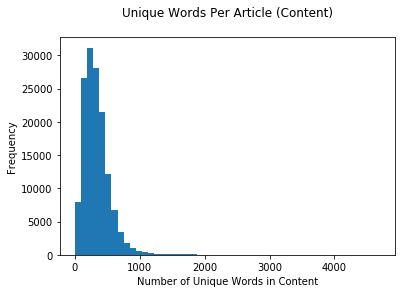

In [15]:
import matplotlib.pyplot as plt

ax = articles['unique_content_count'].plot(kind='hist', bins=50)
ax.set_title('Unique Words Per Article (Content)\n')
ax.set_ylabel('Frequency')
ax.set_xlabel('Number of Unique Words in Content')

Text(0.5,0,'Number of Unique Words in Title')

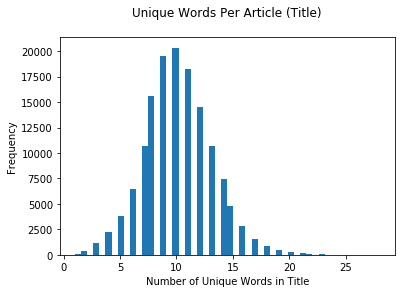

In [16]:
ax = articles['unique_title_count'].plot(kind='hist', bins=50)
ax.set_title('Unique Words Per Article (Title)\n')
ax.set_ylabel('Frequency')
ax.set_xlabel('Number of Unique Words in Title')

**Number of Articles Published per Year

In [ ]:
articles['year'].value_counts()

**Removing Stop Words from Content/ Title**

In [18]:
from nltk.corpus import stopwords

stop = stopwords.words('english')
articles['content_clean'] = articles['content_clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
articles['title_clean'] = articles['title_clean'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))
display(articles.head(3))

,id,title,publication,author,date,year,month,url,content,content_clean,title_clean,content_word_count,title_word_count,unique_content_count,unique_title_count
0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...,washington congressional republicans new fear ...,house republicans fret winning health care sui...,876,13,389,13
1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood...",bullet shells get counted blood dries votive c...,rift officers residents killings persist south...,4743,15,1403,15
2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri...",walt disneys bambi opened 1942 critics praised...,tyrus wong bambi artist thwarted racial bias d...,2350,15,920,15


**Stemming - Title

In [19]:
from nltk.stem import SnowballStemmer
stemmer = SnowballStemmer("english")
articles['title_clean'] = articles["title_clean"].apply(lambda x: ' '.join([stemmer.stem(word) for word in x.split()]))
display(articles.head(3))

,id,title,publication,author,date,year,month,url,content,content_clean,title_clean,content_word_count,title_word_count,unique_content_count,unique_title_count
0,17283,House Republicans Fret About Winning Their Hea...,New York Times,Carl Hulse,2016-12-31,2016.0,12.0,NaN,WASHINGTON — Congressional Republicans have...,washington congressional republicans new fear ...,hous republican fret win health care suit new ...,876,13,389,13
1,17284,Rift Between Officers and Residents as Killing...,New York Times,Benjamin Mueller and Al Baker,2017-06-19,2017.0,6.0,NaN,"After the bullet shells get counted, the blood...",bullet shells get counted blood dries votive c...,rift offic resid kill persist south bronx new ...,4743,15,1403,15
2,17285,"Tyrus Wong, ‘Bambi’ Artist Thwarted by Racial ...",New York Times,Margalit Fox,2017-01-06,2017.0,1.0,NaN,"When Walt Disney’s “Bambi” opened in 1942, cri...",walt disneys bambi opened 1942 critics praised...,tyrus wong bambi artist thwart racial bias die...,2350,15,920,15


**Top 25 Common Words in Content/ Title**

In [20]:
from collections import Counter

print(Counter(" ".join(articles['content_clean']).split()).most_common(25))
print(Counter(" ".join(articles['title_clean']).split()).most_common(25))

[('said', 571036), ('trump', 359300), ('would', 263045), ('one', 260340), ('people', 246575), ('new', 205103), ('also', 181446), ('like', 178338), ('president', 161504), ('time', 143934), ('could', 143570), ('first', 132894), ('years', 131106), ('two', 126636), ('even', 124427), ('says', 123312), ('state', 118877), ('many', 116883), ('u', 116591), ('last', 115701), ('us', 113656), ('clinton', 111045), ('states', 106149), ('told', 106077), ('get', 103644)]
[('trump', 25517), ('breitbart', 15747), ('new', 13678), ('time', 9856), ('york', 8903), ('us', 6899), ('clinton', 5960), ('say', 5567), ('donald', 4771), ('obama', 4089), ('hillari', 3492), ('get', 2872), ('attack', 2787), ('report', 2698), ('state', 2697), ('hous', 2581), ('presid', 2575), ('kill', 2564), ('year', 2388), ('make', 2309), ('polic', 2297), ('white', 2237), ('gop', 2227), ('show', 2180), ('republican', 2176)]


**Word Clouds for each Publication based on 'Content'**

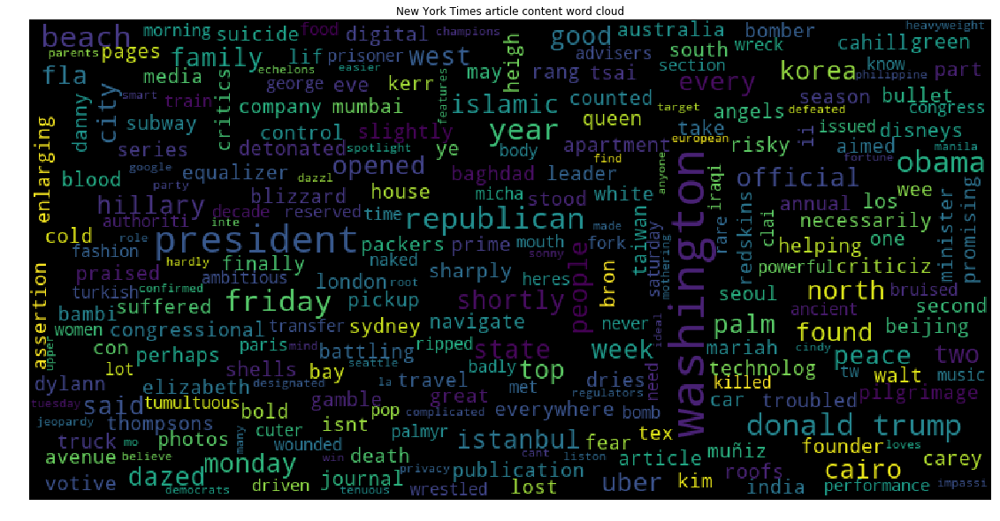

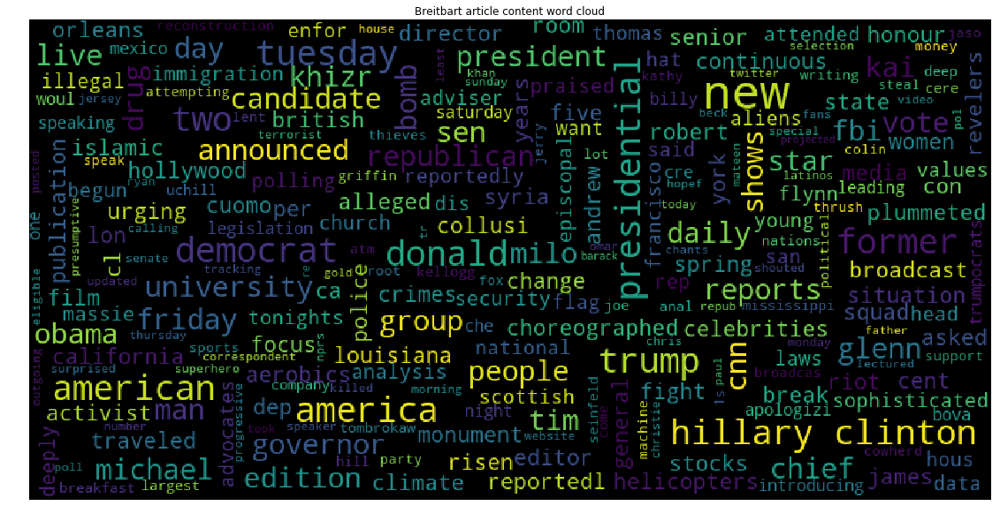

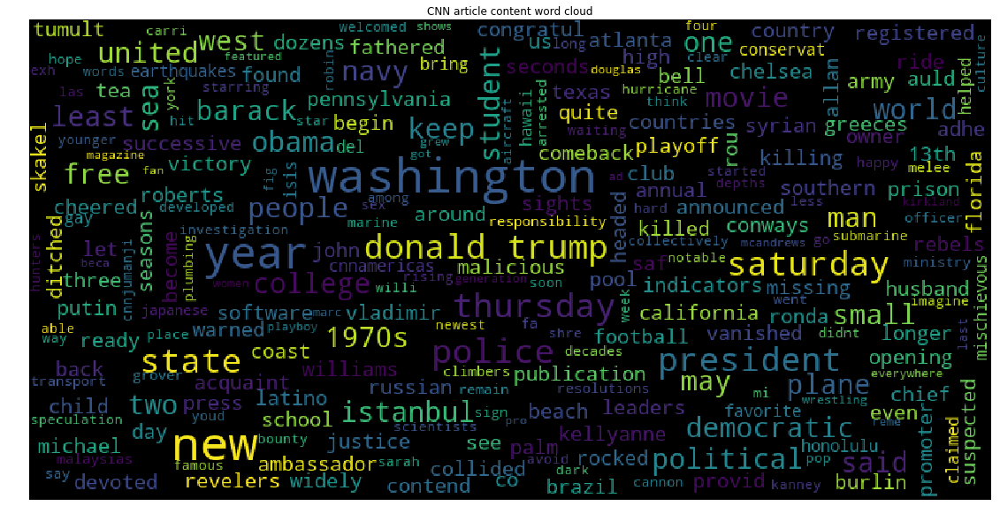

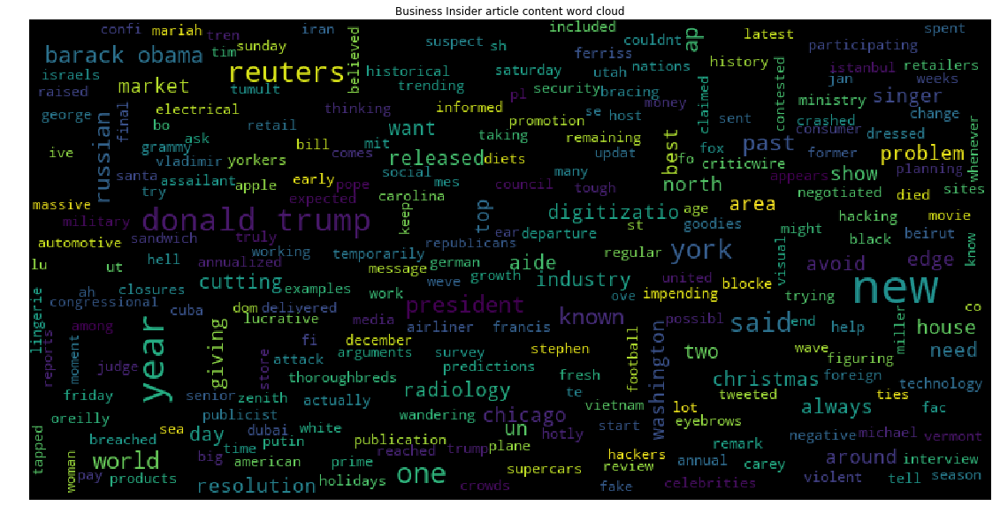

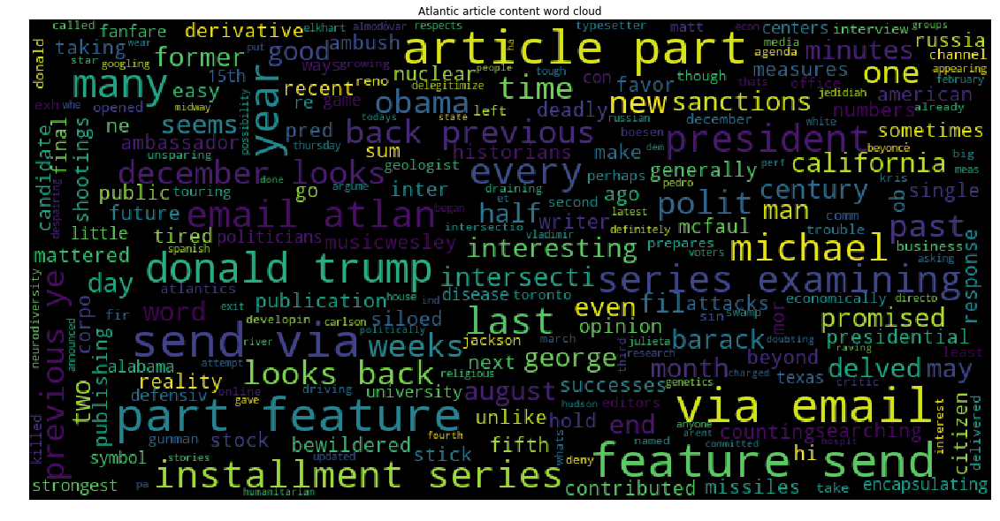

...

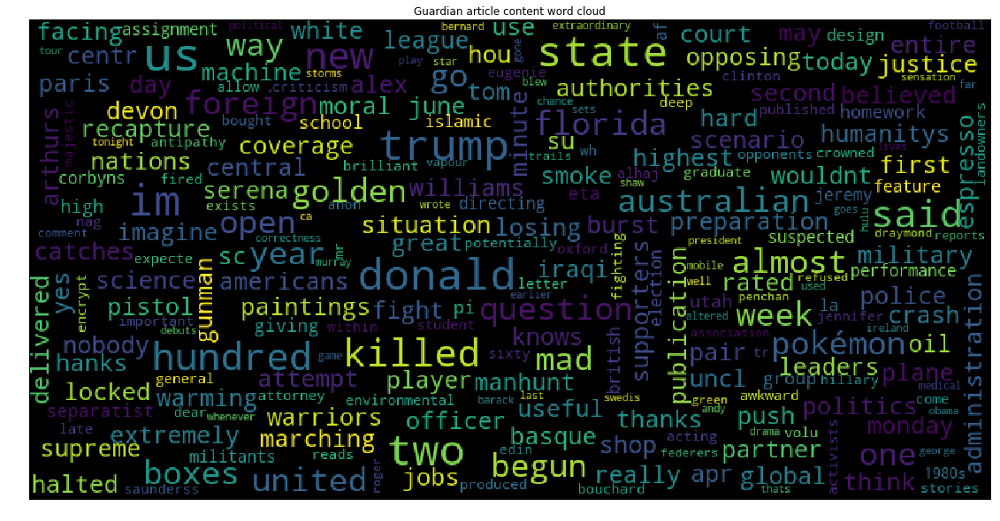

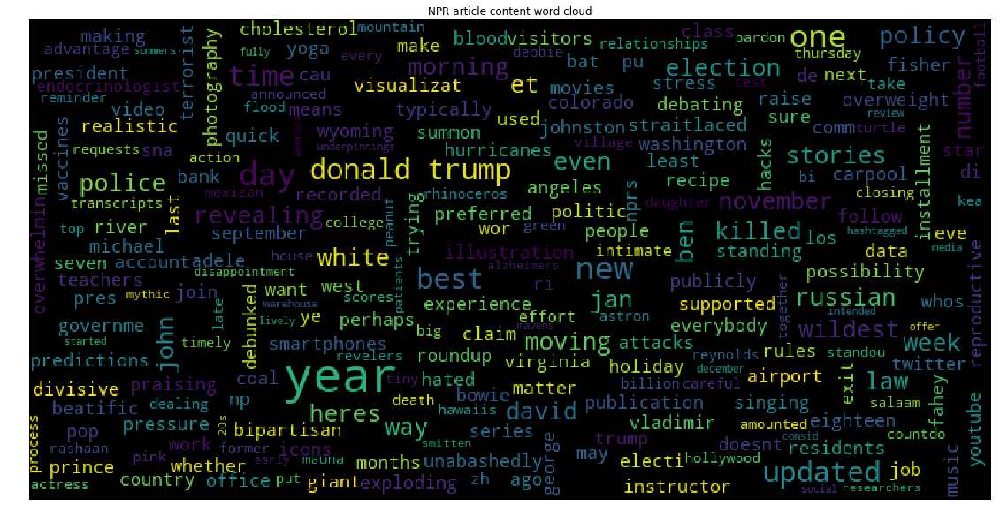

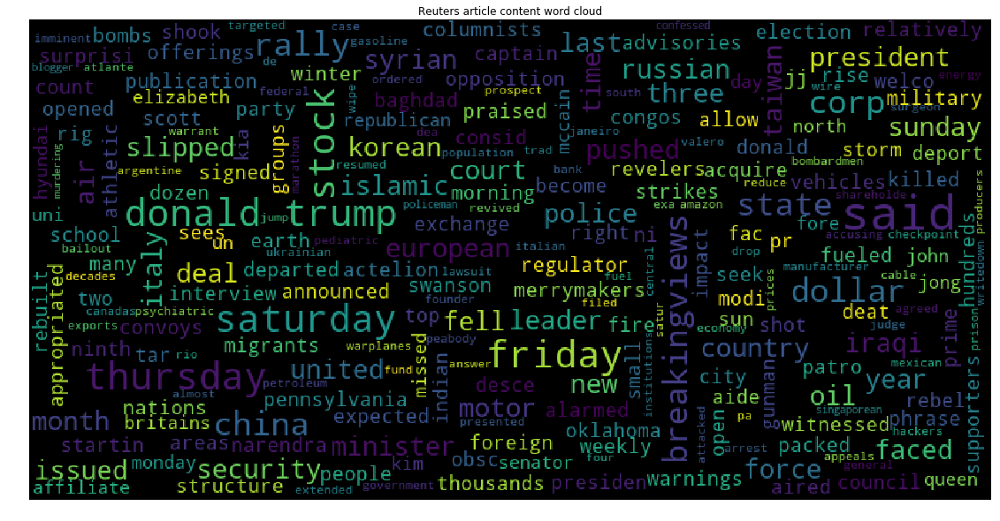

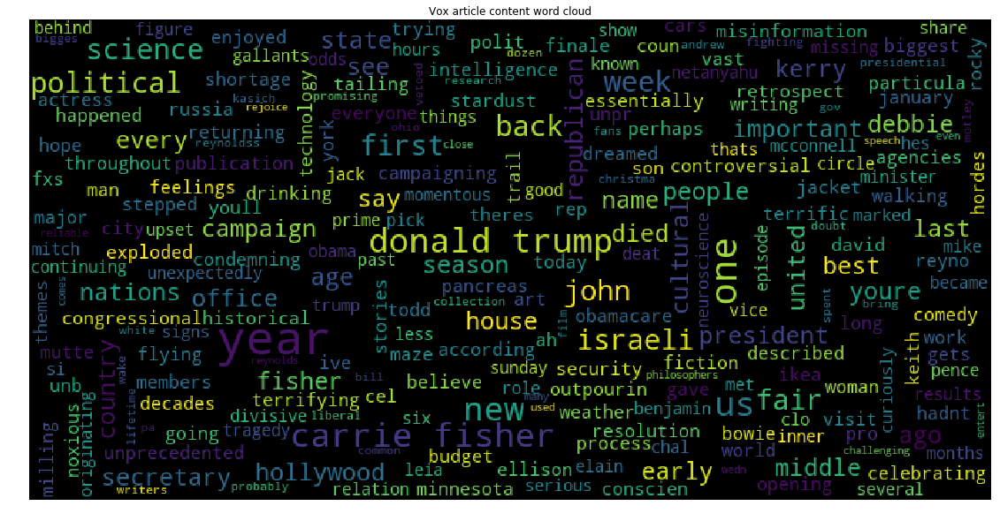

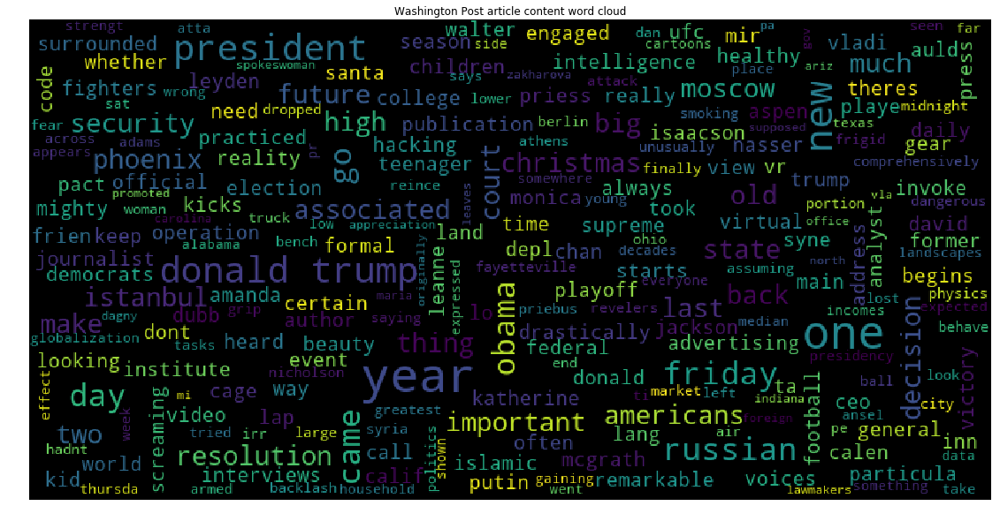

In [22]:
from wordcloud import WordCloud, STOPWORDS

publishers = articles.publication.unique()
articles = articles.set_index('publication')  
for i in publishers:
    text = articles.loc[i]
    stopwords = set(STOPWORDS)
    words = i.split()
    for word in words:
        stopwords.add(word)
    wordcloud = WordCloud(
                            background_color='black',
                            stopwords=stopwords,
                            max_words=250,
                            max_font_size=40,
                            width=800,
                            height=400
                             ).generate(str(text['content_clean']))
    

    fig = plt.figure(figsize=(20,10))
    plt.imshow(wordcloud)
    plt.title(i + ' articles content word cloud')
    plt.axis('off')
    plt.show()



**Word Clouds for each Publication based on 'Title'**

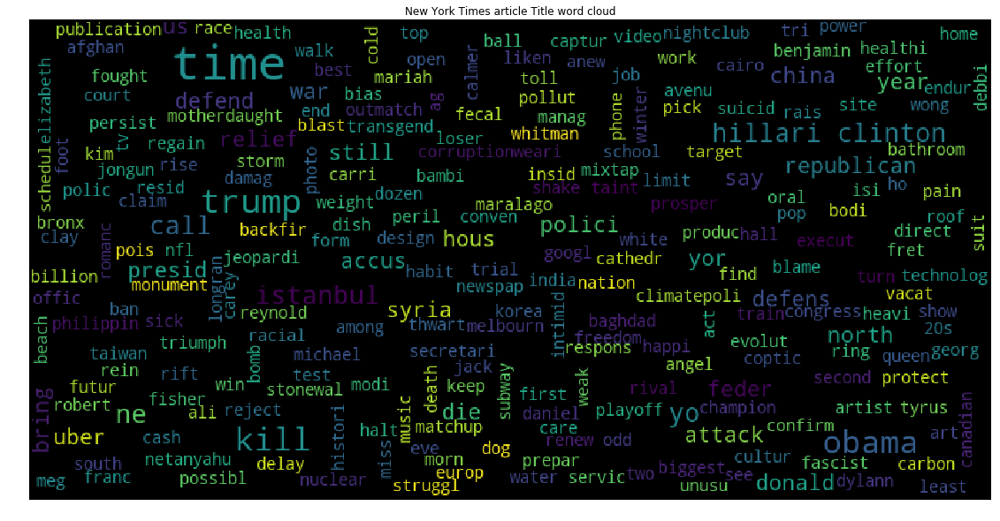

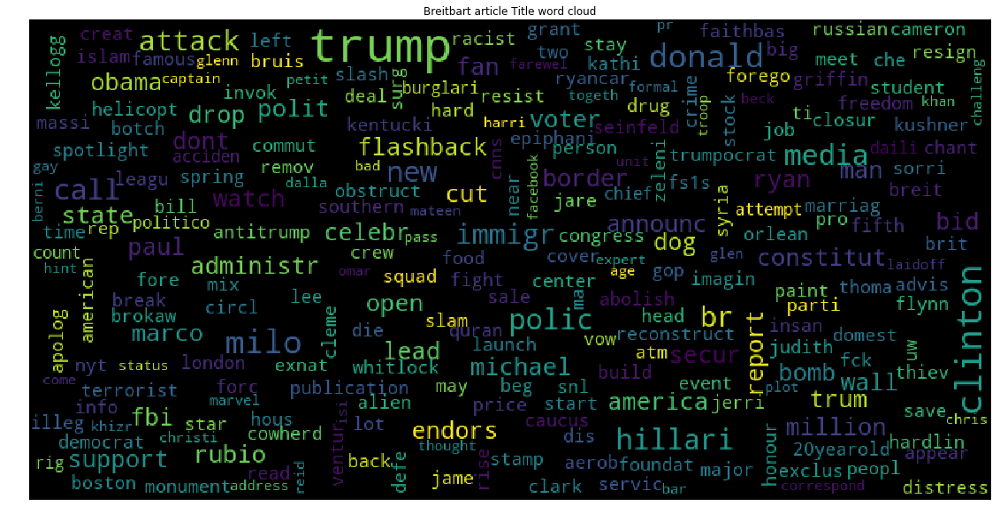

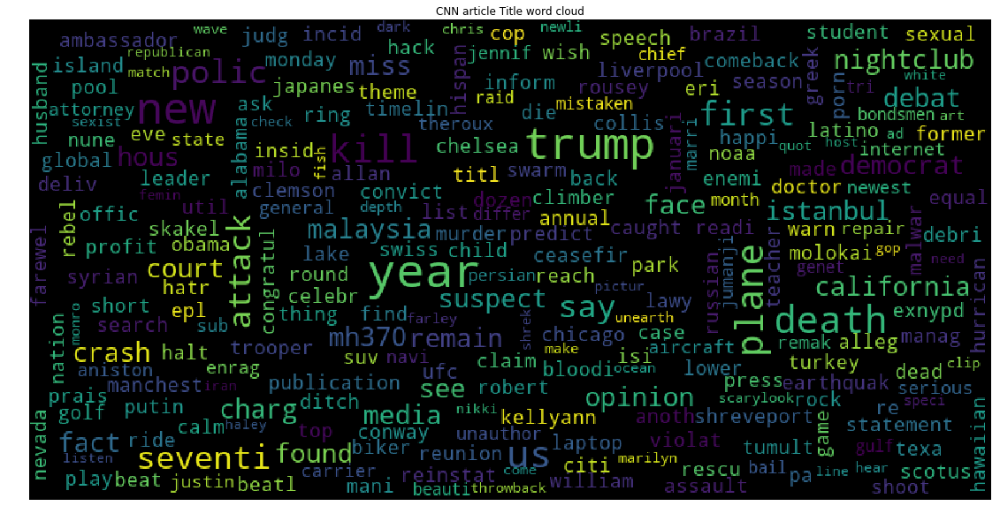

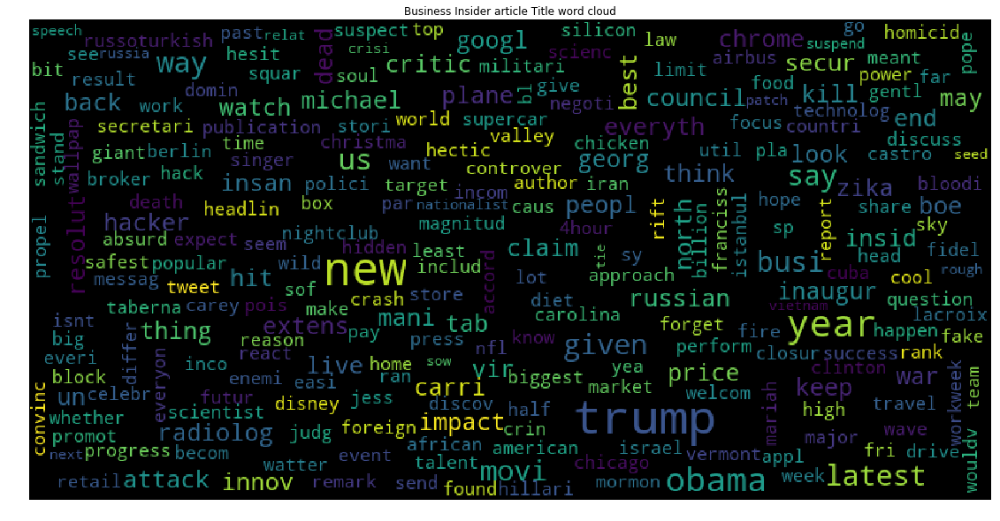

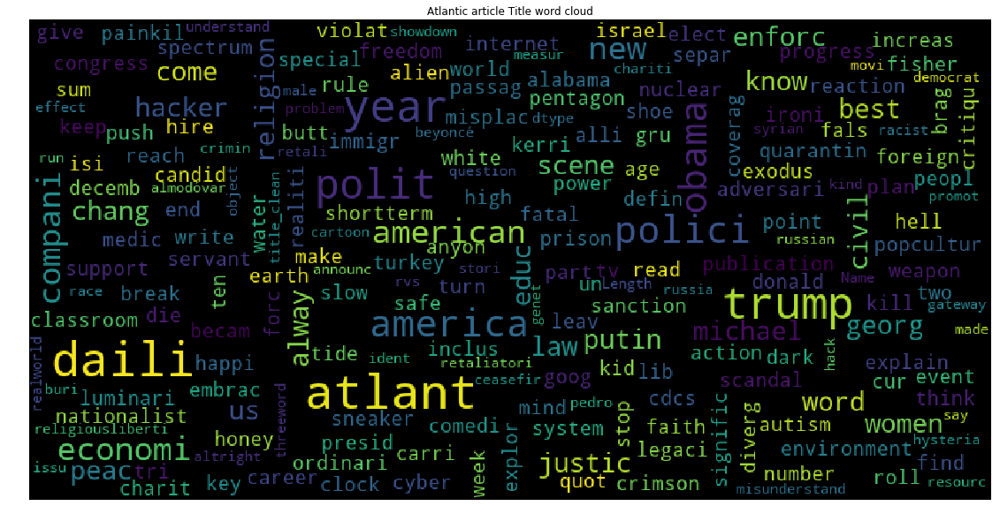

...

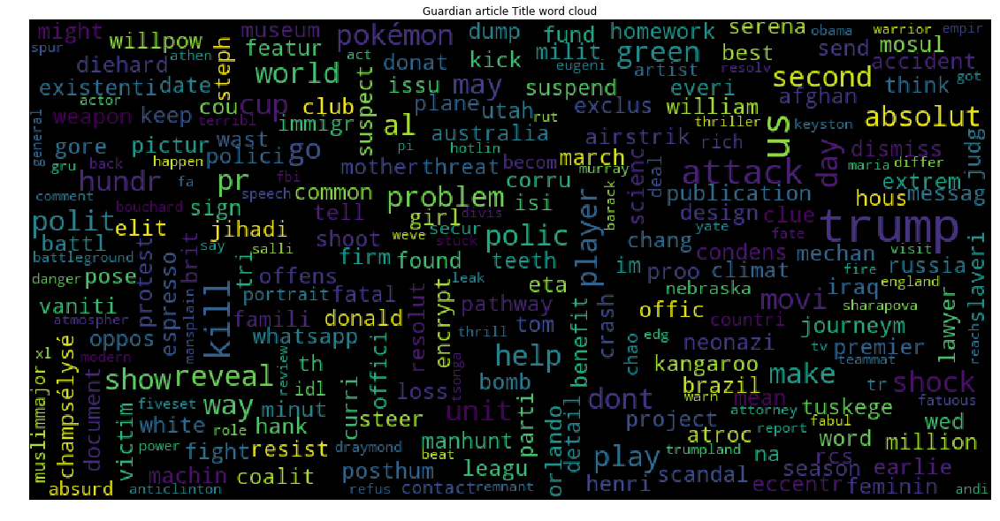

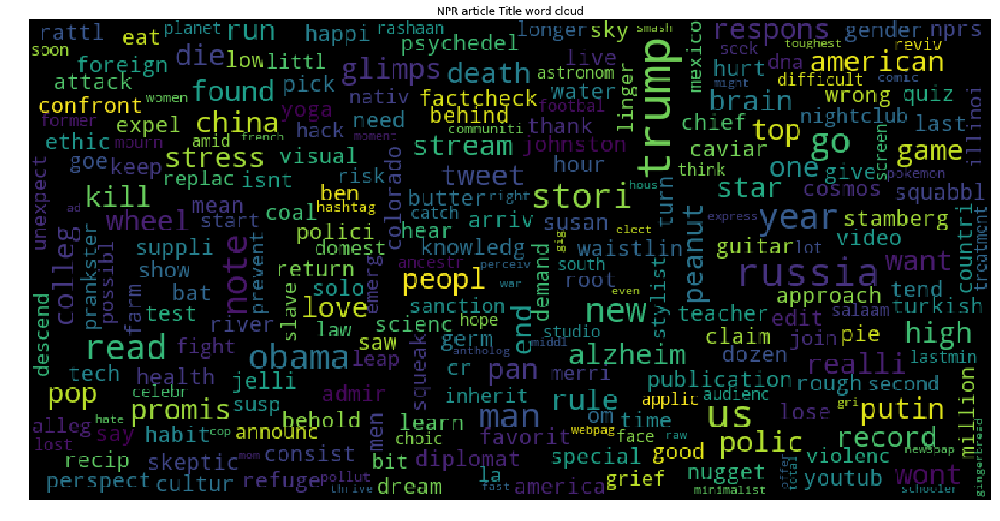

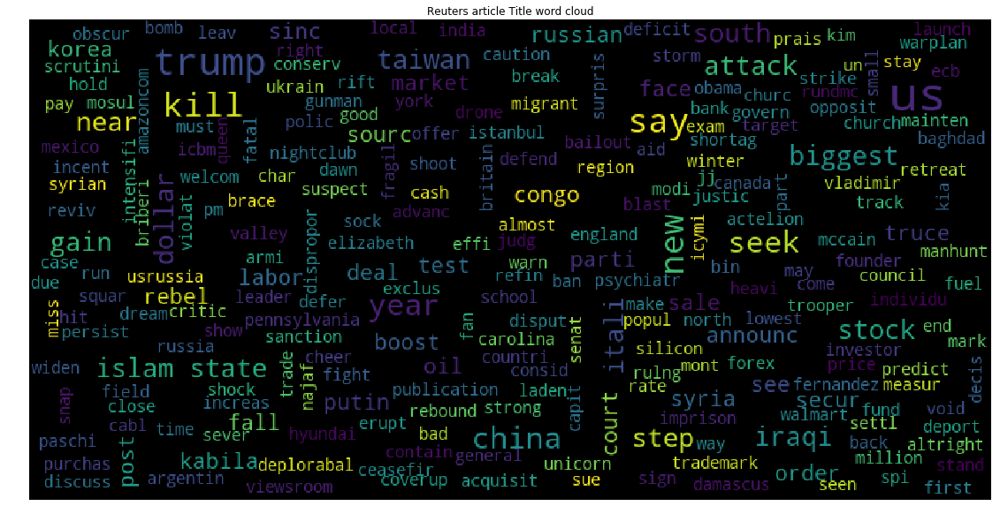

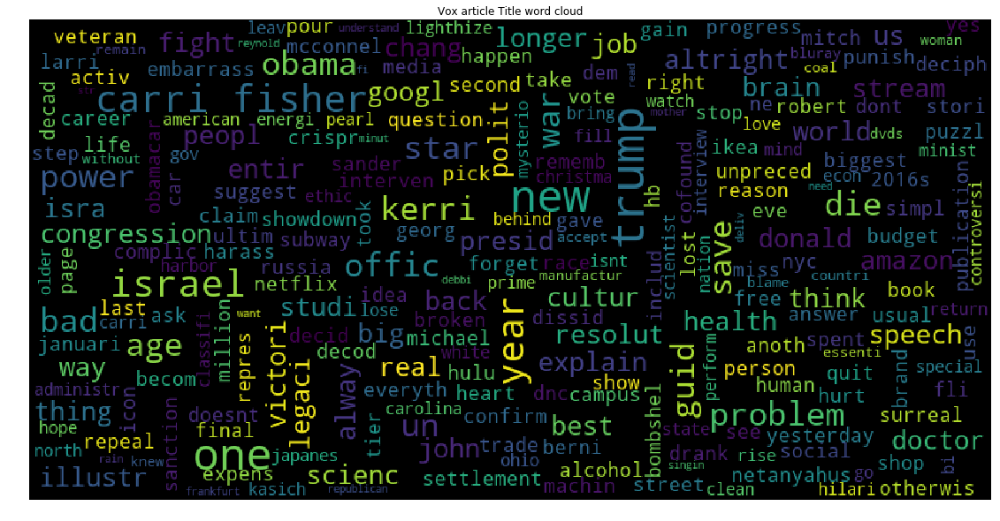

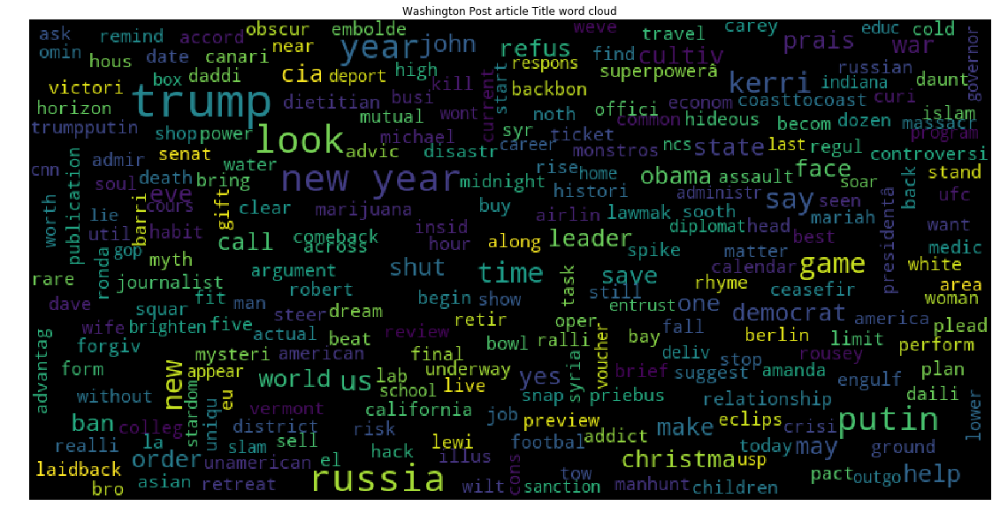

In [23]:
for i in publishers:
    text = articles.loc[i]
    stopwords = set(STOPWORDS)
    words = i.split()
    for word in words:
        stopwords.add(word)
    wordcloud = WordCloud(
                            background_color='black',
                            stopwords=stopwords,
                            max_words=250,
                            max_font_size=40,
                            width=800,
                            height=400
                             ).generate(str(text['title_clean']))
    

    fig = plt.figure(figsize=(20,10))
    plt.imshow(wordcloud)
    plt.title(i + ' articles Title word cloud')
    plt.axis('off')
    plt.show()


**Using TF-IDF Vectorizer to find the TF-IDF Scores for words in Title

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_df = 0.9,stop_words='english')
X = vectorizer.fit_transform(articles['title_clean'])
X.shape #(142458, 35763)

**Performing Clustering to Group Similar Atricles Together based on Titles

Fit 2 clusters
Fit 4 clusters
Fit 6 clusters
Fit 8 clusters
Fit 10 clusters
Fit 12 clusters
Fit 14 clusters
Fit 16 clusters
Fit 18 clusters
Fit 20 clusters
Fit 22 clusters
Fit 24 clusters


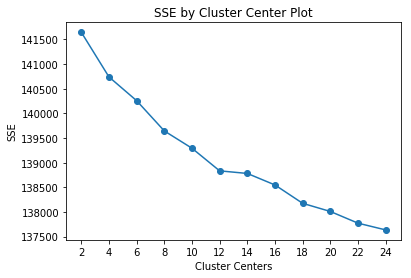

In [26]:
from sklearn.cluster import MiniBatchKMeans

def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1, 2)
    
    sse = []
    for k in iters:
        sse.append(MiniBatchKMeans(n_clusters = k, init_size = 1024, batch_size = 2048, random_state=20).fit(data).inertia_)
        print('Fit {} clusters'.format(k))
        
    f, ax = plt.subplots(1, 1)
    ax.plot(iters, sse, marker='o')
    ax.set_xlabel('Cluster Centers')
    ax.set_xticks(iters)
    ax.set_xticklabels(iters)
    ax.set_ylabel('SSE')
    ax.set_title('SSE by Cluster Center Plot')
    
find_optimal_clusters(X, 25)

In [27]:
clusters = MiniBatchKMeans(n_clusters =18, init_size=1024, batch_size=2048, random_state=20).fit_predict(X)

**Number of Atricles in each Cluster

In [28]:
n_clusters = 18
for i in range(n_clusters):
    print(np.sum(clusters == i))

11396
12891
10714
3590
1457
8452
1561
4201
1147
318
3080
1950
72240
763
2330
766
1069
4533


**Wordlcoud for Artcles (Titles) in each Cluster

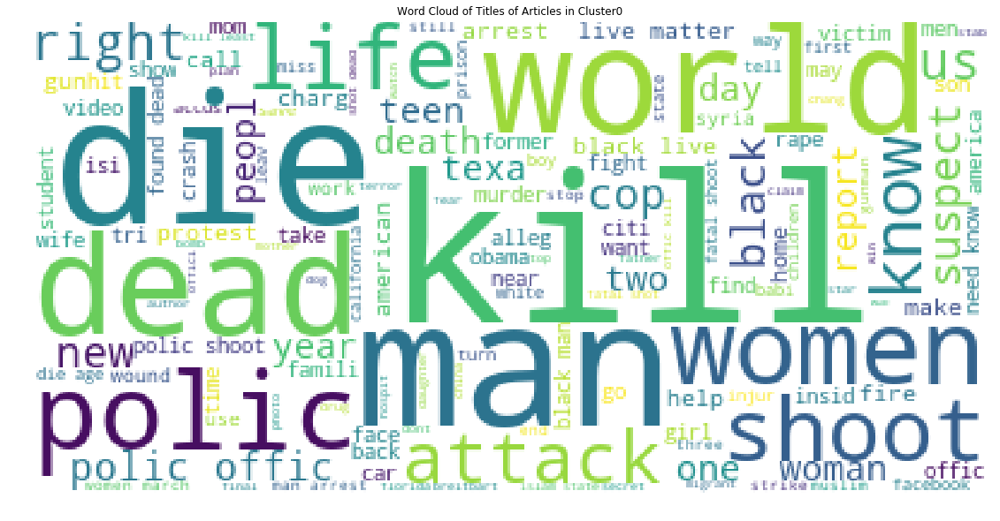

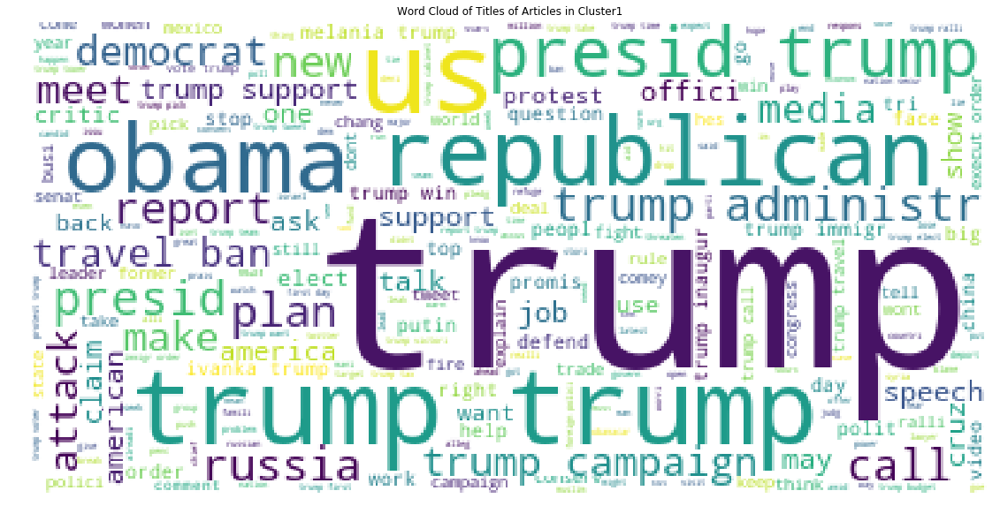

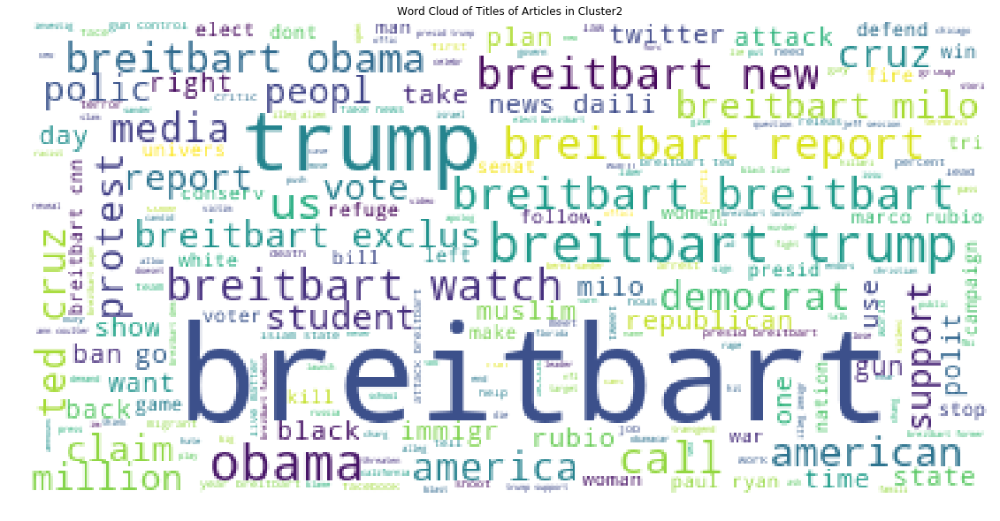

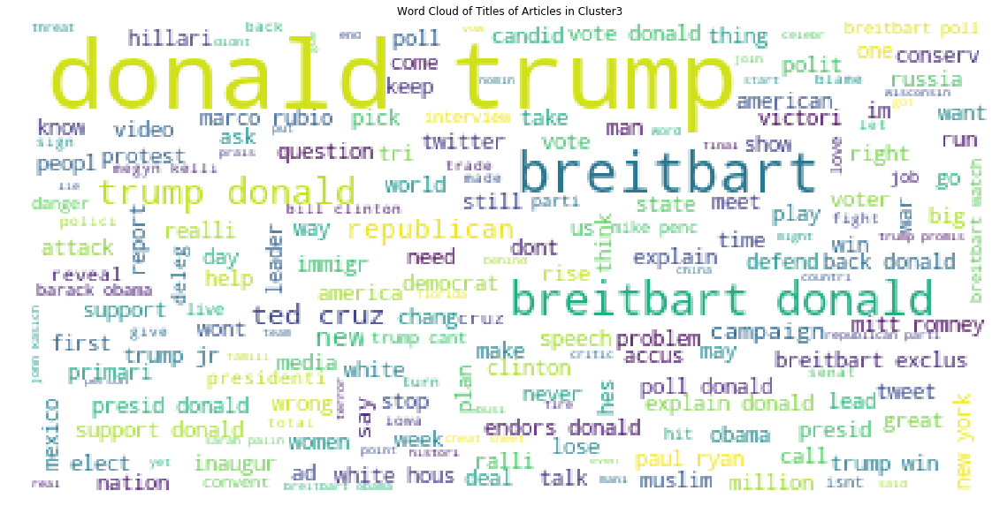

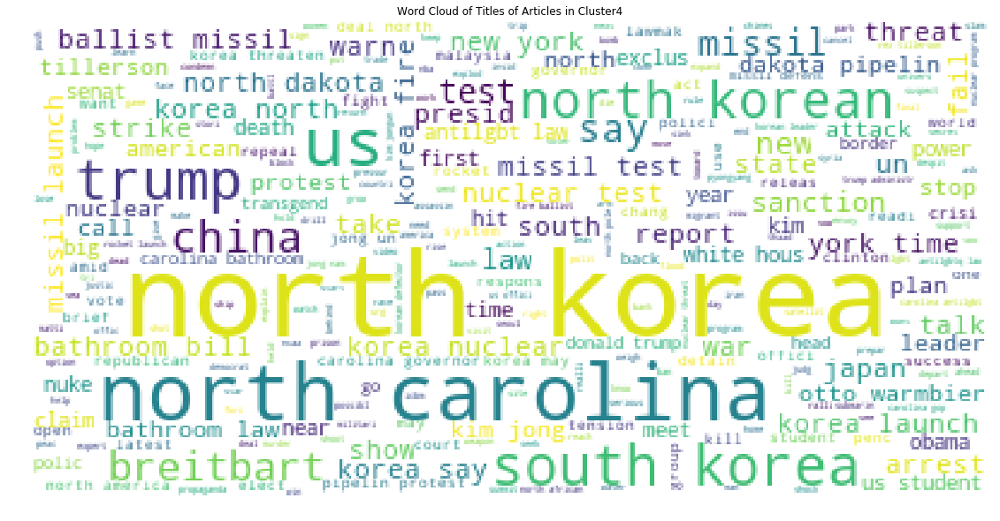

...

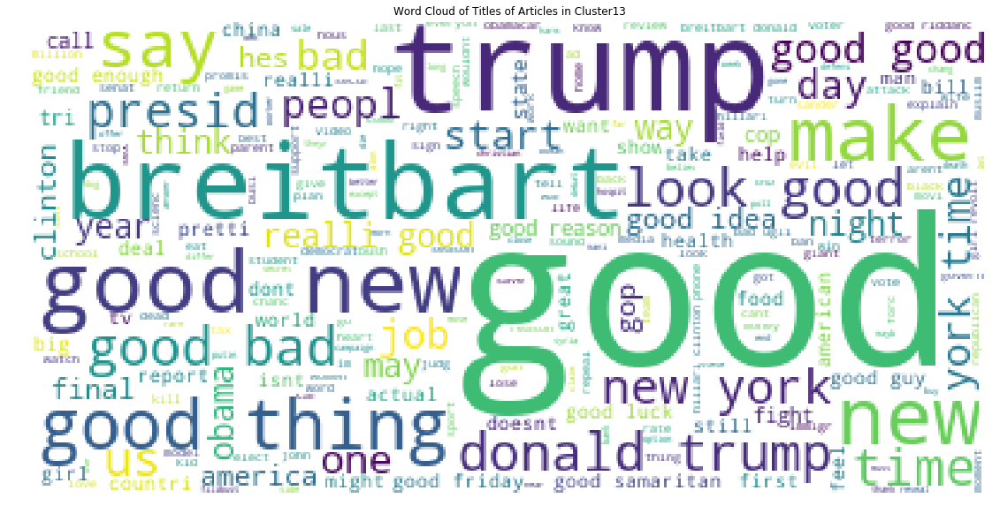

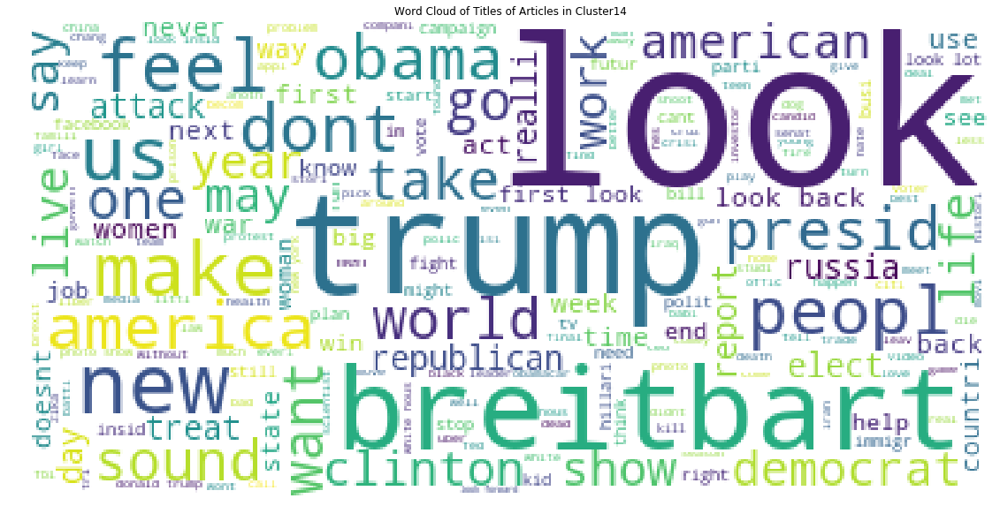

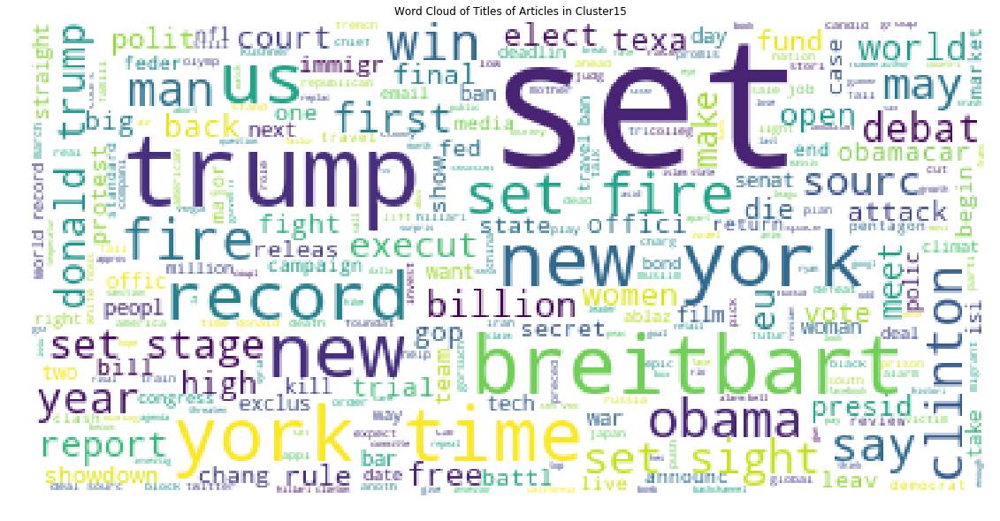

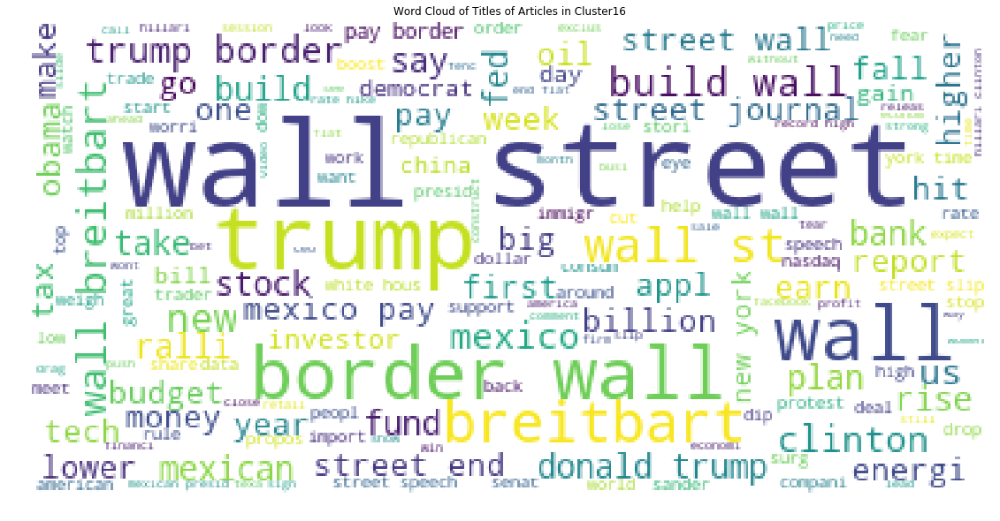

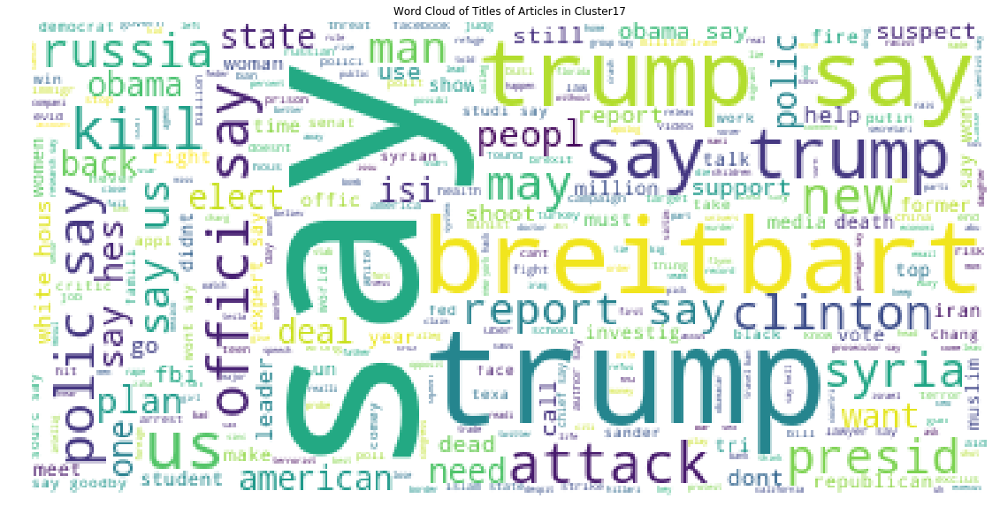

In [29]:
for i in range(n_clusters):
    clu = np.where(clusters == i)[0]
    clu_titles = articles["title_clean"][clu]
    all_titles = ' '.join(clu_titles)
    wordcloud = WordCloud(stopwords=stopwords, background_color="white", max_words=1000).generate(all_titles)
    fig = plt.figure(figsize=(20,10))
    plt.imshow(wordcloud)
    plt.title('Word Cloud of Titles of Articles in Cluster - '+ str(i))
    plt.axis('off')
    plt.show()

**Top 10 Words (Titles) and their Count in each Cluster

C:\Users\Hasitha Rasineni\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 1440x720 with 0 Axes>

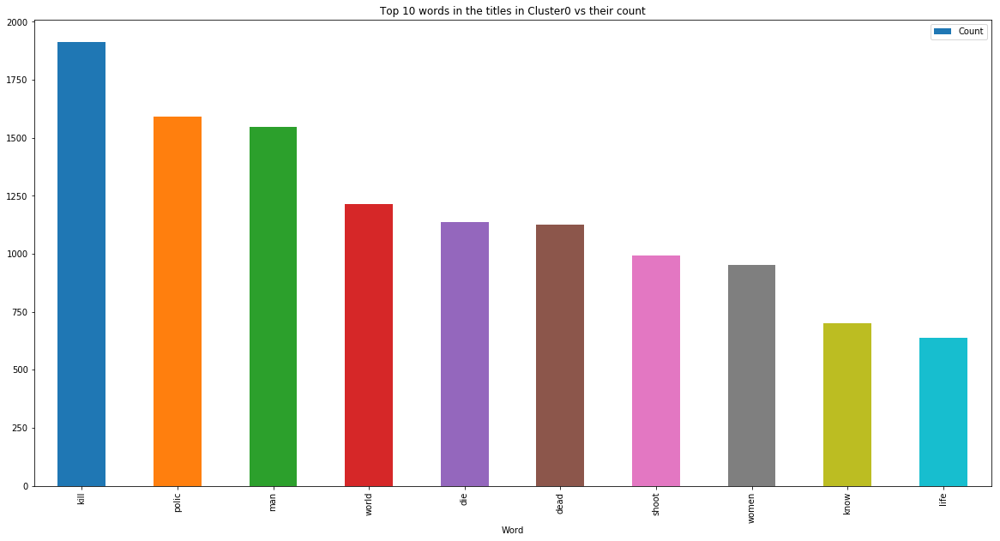

<Figure size 1440x720 with 0 Axes>

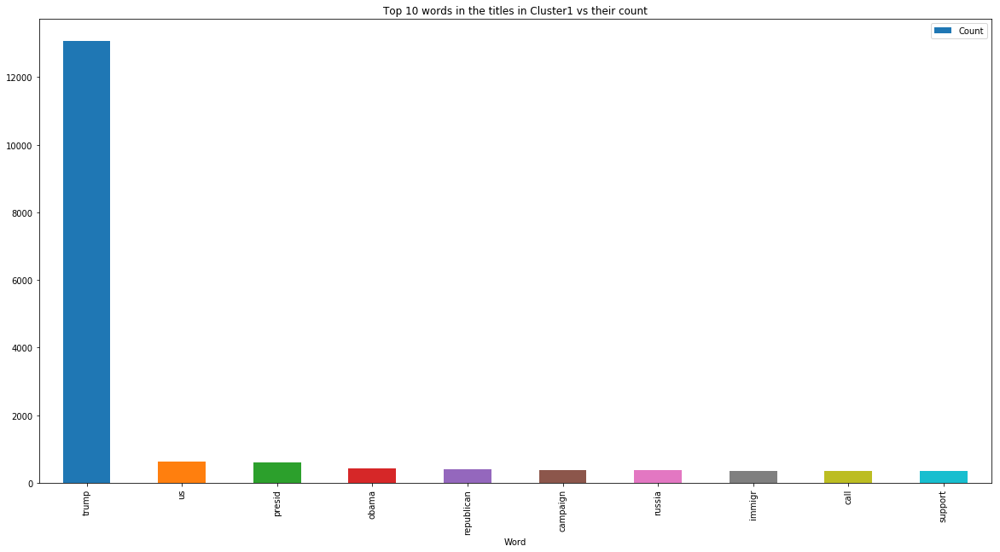

<Figure size 1440x720 with 0 Axes>

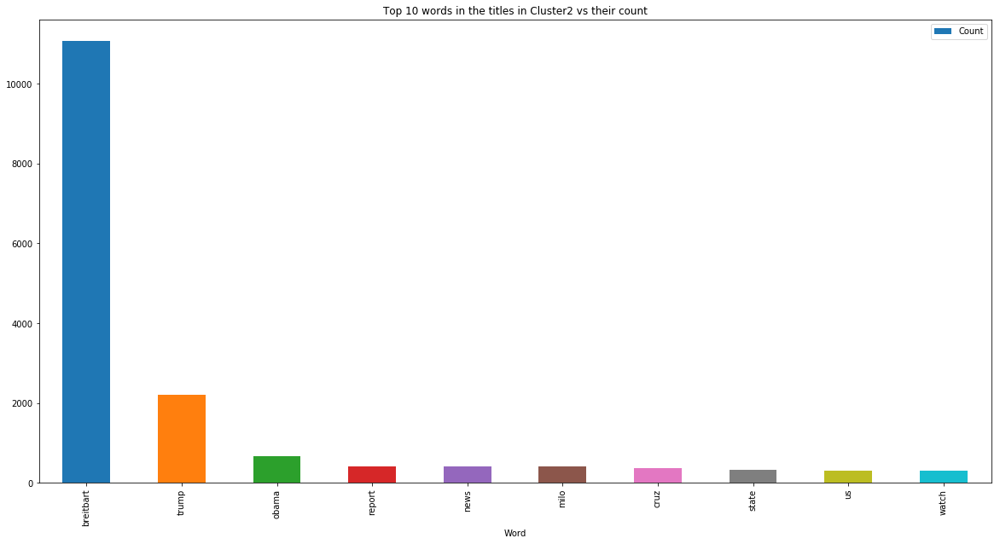

<Figure size 1440x720 with 0 Axes>

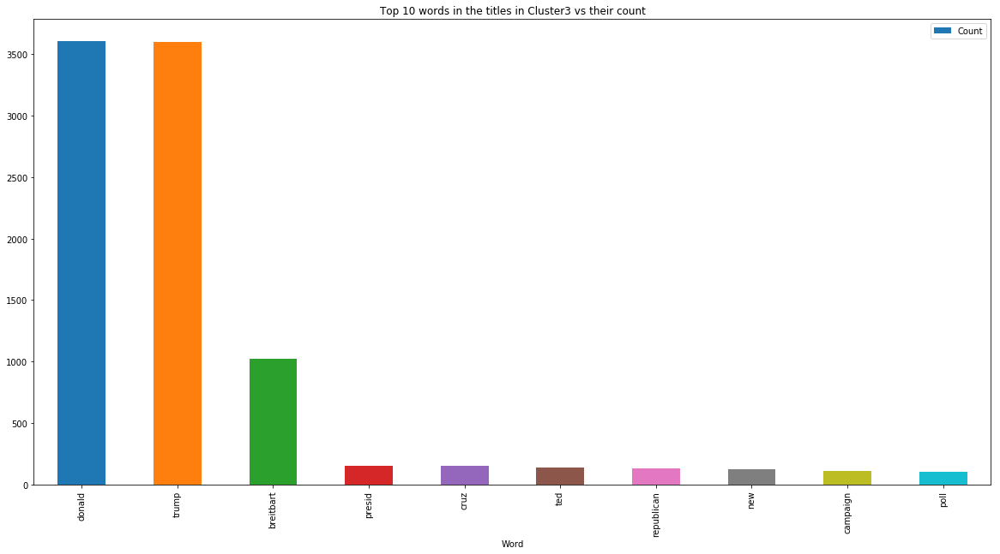

<Figure size 1440x720 with 0 Axes>

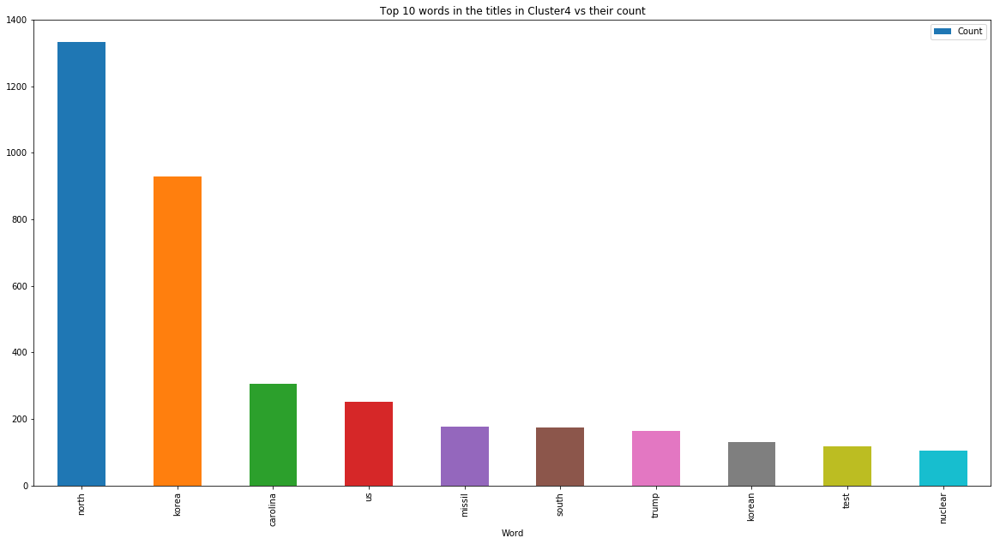

<Figure size 1440x720 with 0 Axes>

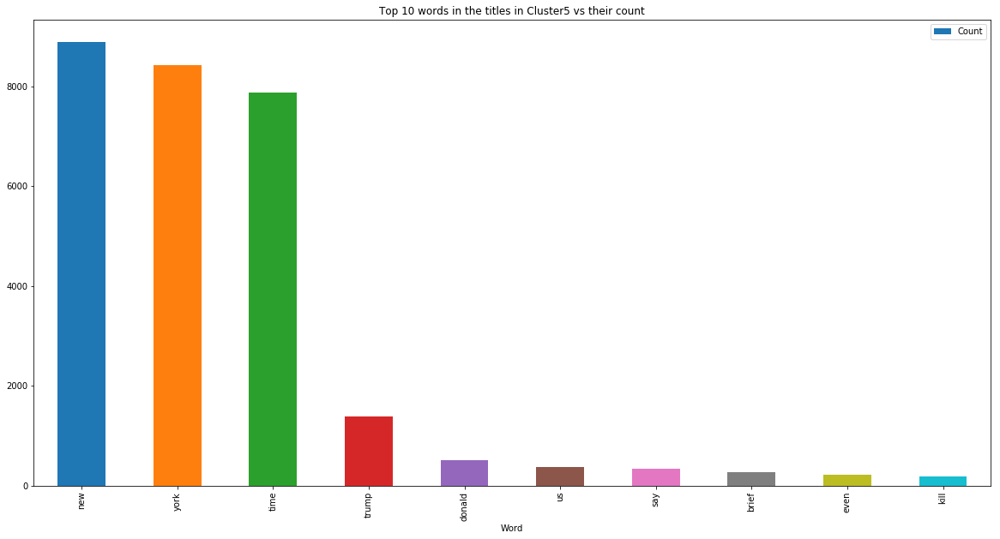

<Figure size 1440x720 with 0 Axes>

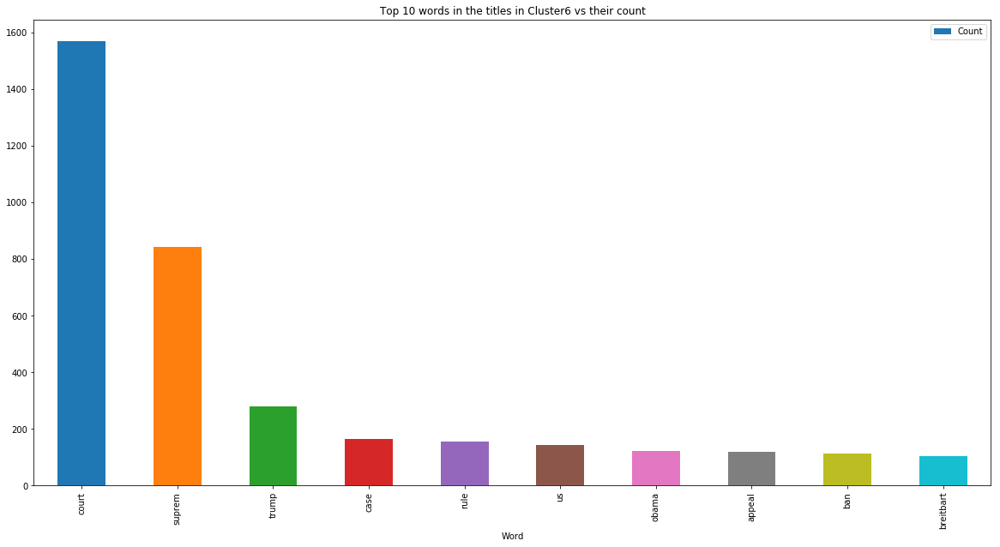

<Figure size 1440x720 with 0 Axes>

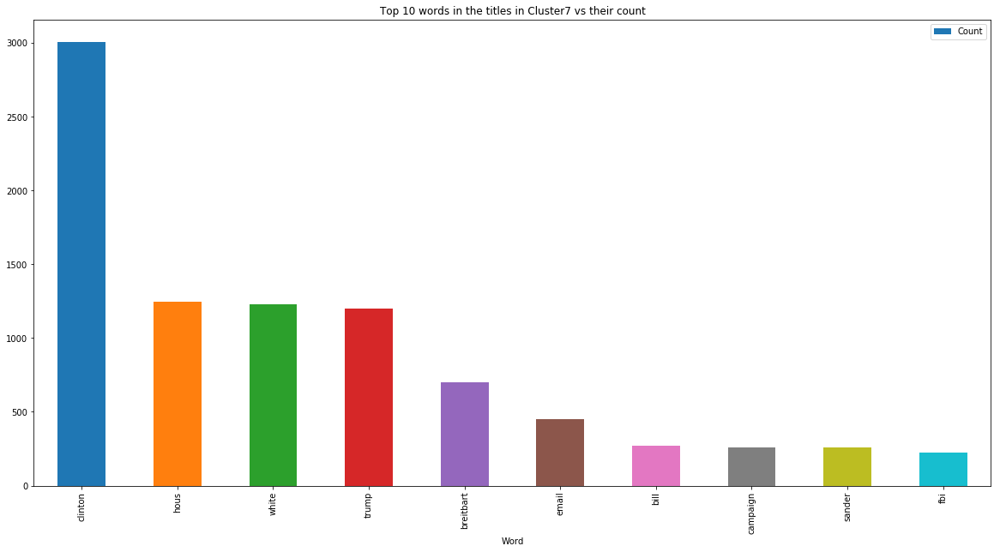

<Figure size 1440x720 with 0 Axes>

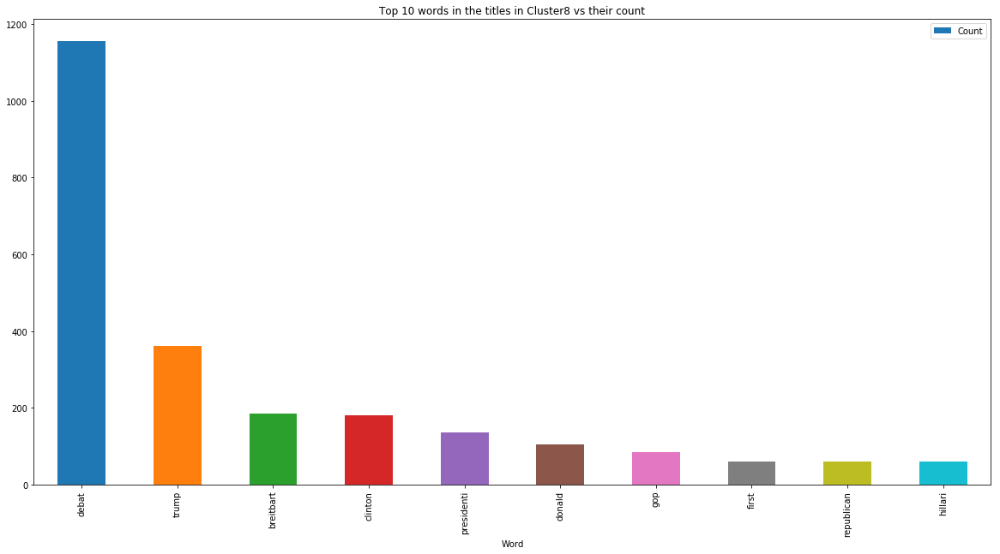

<Figure size 1440x720 with 0 Axes>

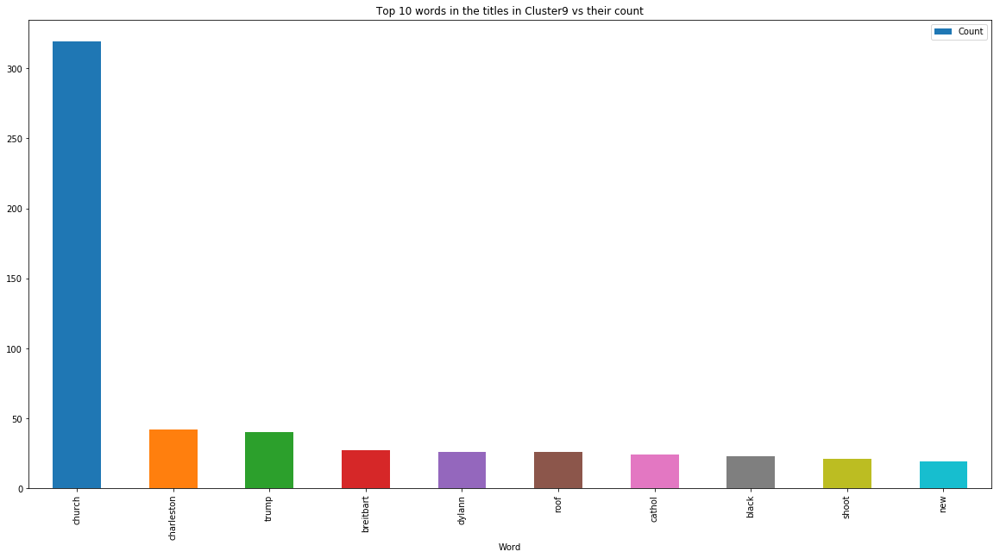

<Figure size 1440x720 with 0 Axes>

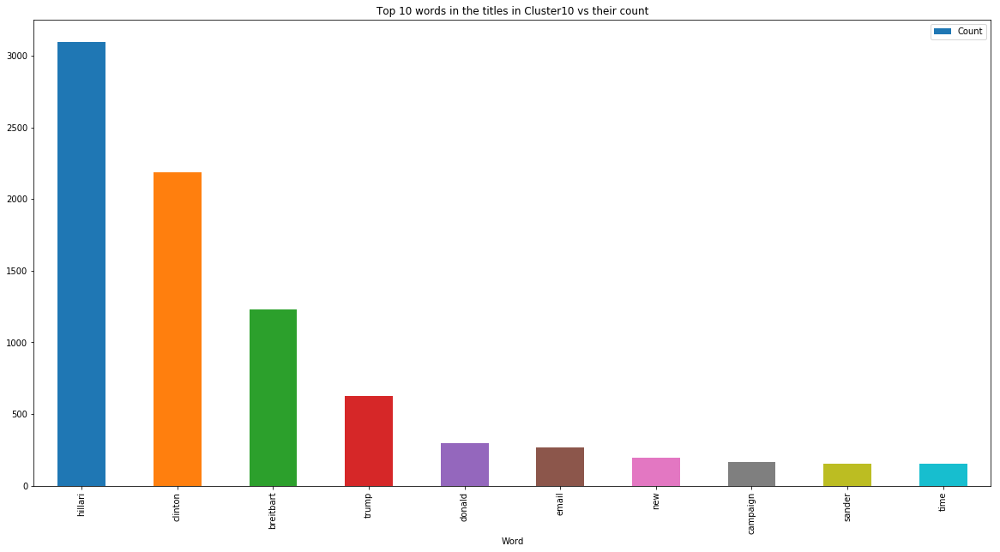

<Figure size 1440x720 with 0 Axes>

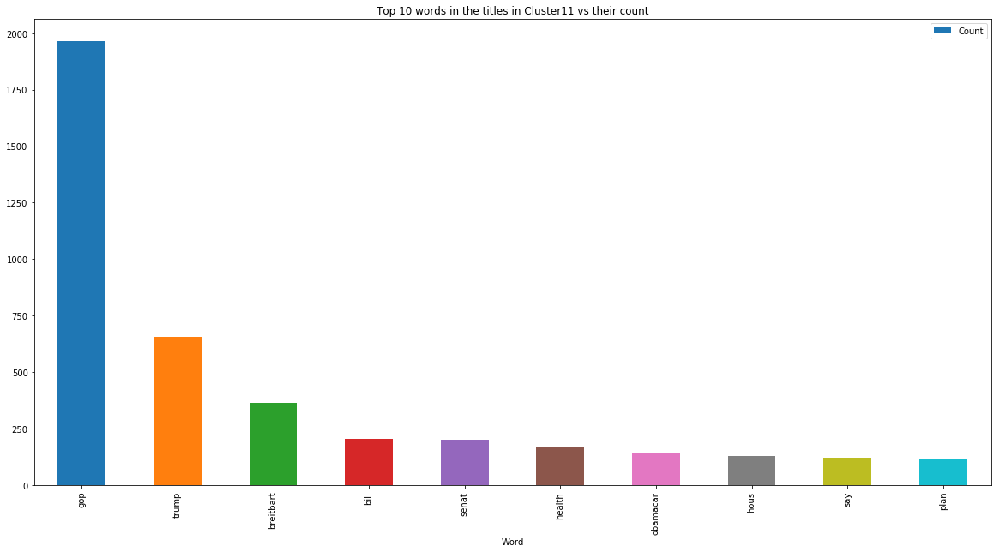

<Figure size 1440x720 with 0 Axes>

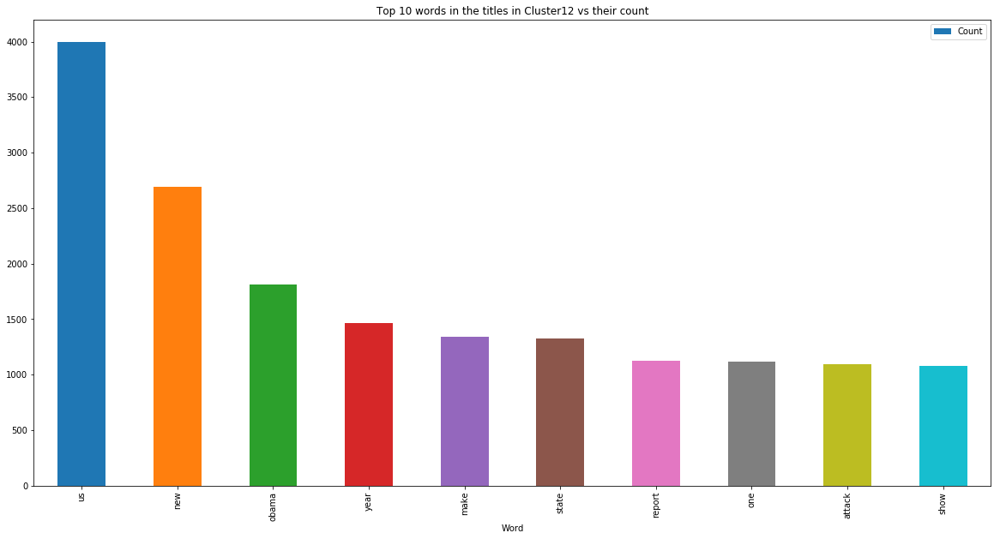

<Figure size 1440x720 with 0 Axes>

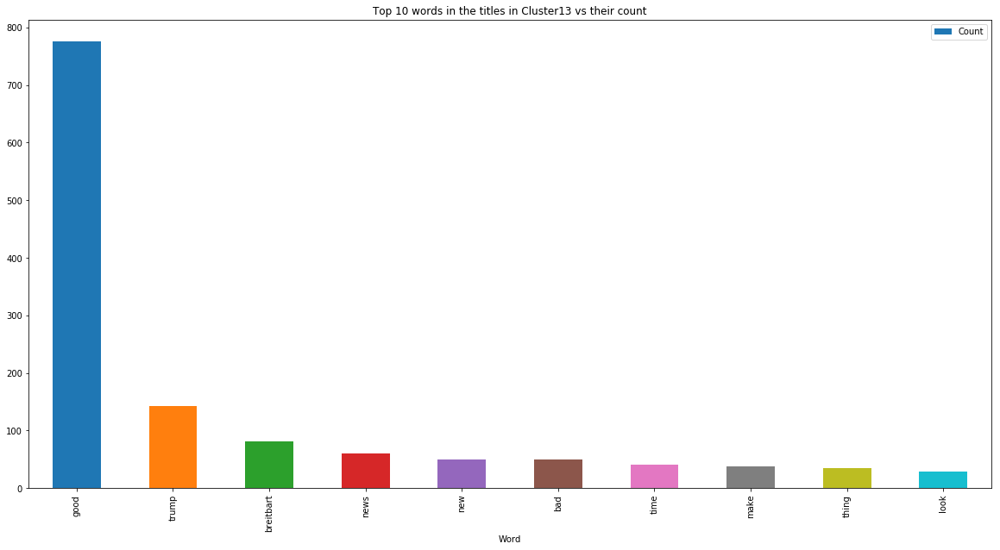

<Figure size 1440x720 with 0 Axes>

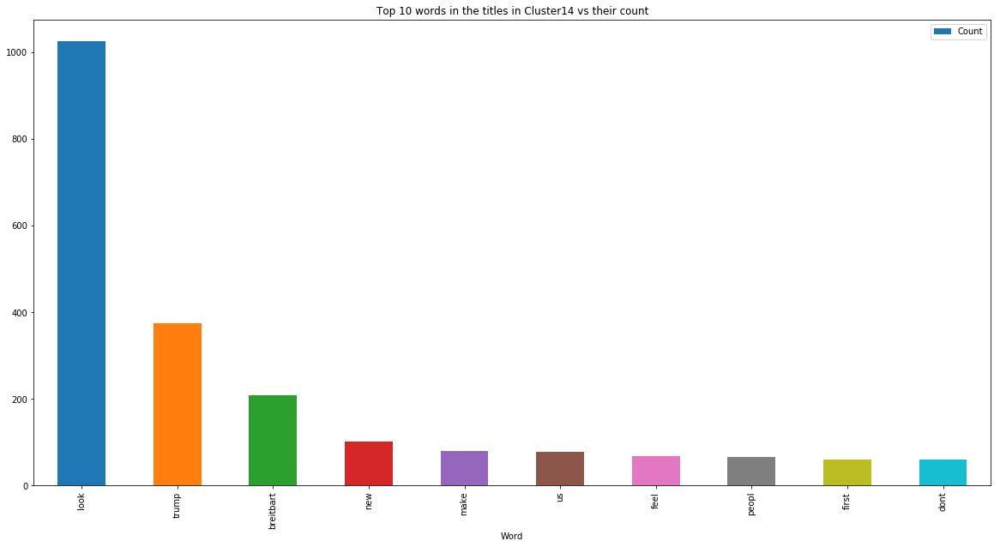

<Figure size 1440x720 with 0 Axes>

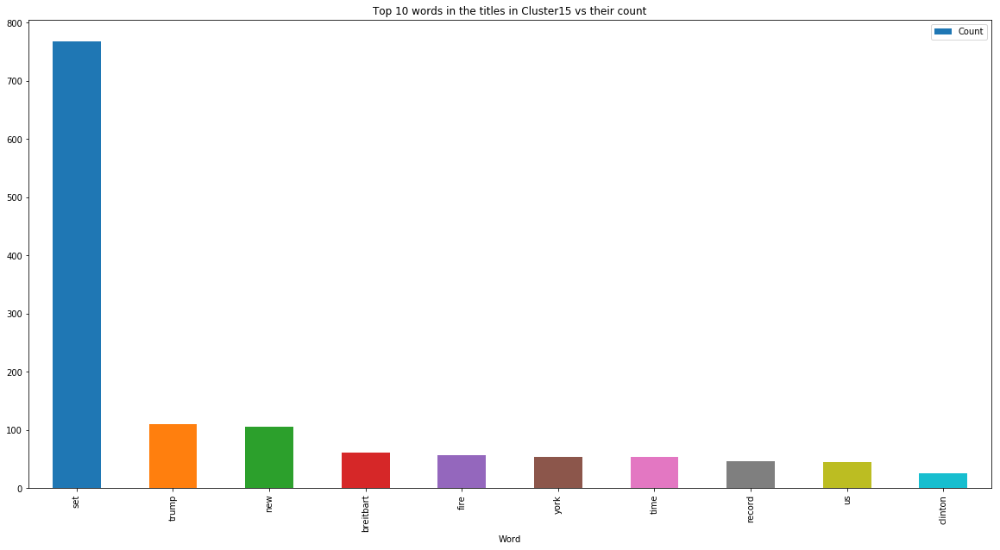

<Figure size 1440x720 with 0 Axes>

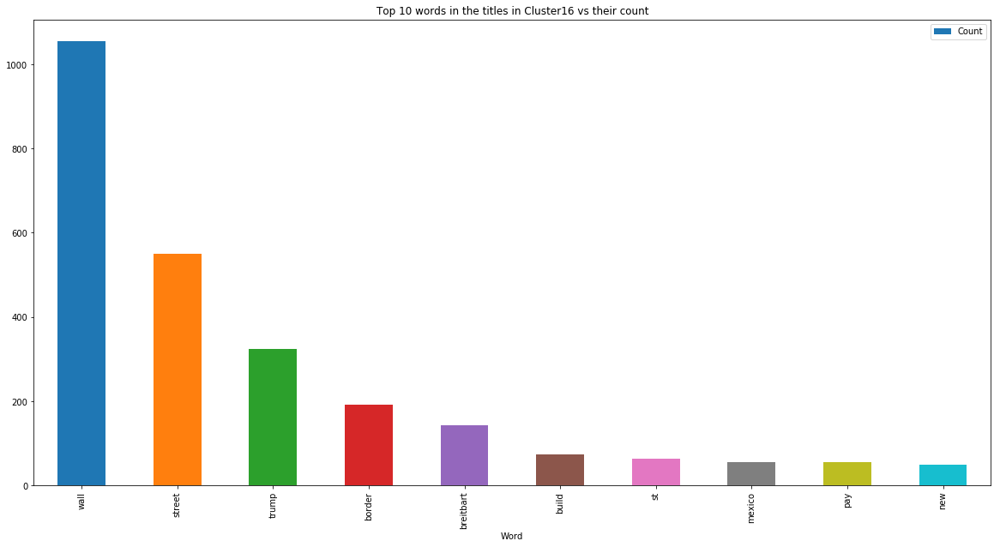

<Figure size 1440x720 with 0 Axes>

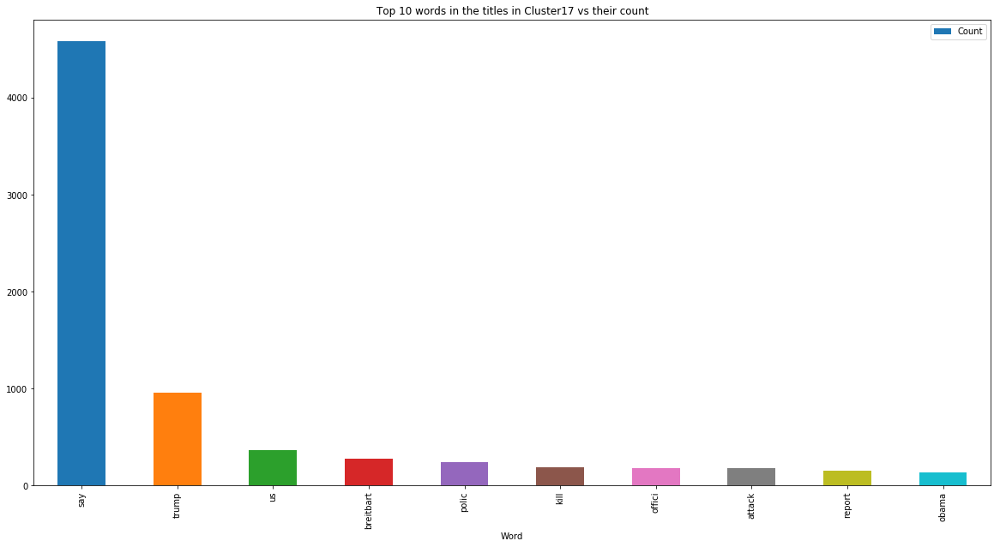

In [45]:
import matplotlib.cm as cm
from matplotlib import rcParams

for i in range(n_clusters):
    clu = np.where(clusters == i)[0]
    clu_titles = articles["title_clean"][clu]
    all_titles = ' '.join(clu_titles)
    filtered_words = [word for word in all_titles.split() if word not in stopwords]
    counted_words = Counter(filtered_words)
    count = counted_words.most_common(10)
    df = pd.DataFrame(count, columns = ['Word', 'Count'])
    fig = plt.figure(figsize=(20,10))
    df.plot.bar(x='Word',y='Count', title = 'Top 10 words in the titles in Cluster - ' + str(i) +' vs their count')
